This notebook provides a solution to **finetuning** a YOLO model so that it can detect new items. YOLOv8 was initially pretrained on the [COCO dataset](https://gist.github.com/SrikarNamburu/0945de8f9a8714ec245dde3443e9d487) which contains 80 objects, in which welding defect is not one of it. Therefore, this notebook will show how we can train YOLOv8 to be able to recognize welding defects.

## Dataset

The dataset we are using is a dataset on Welding Defects which are retrieved from [Kaggle](https://www.kaggle.com/code/muhammadfaizan65/welding-defect-object-detection-using-yolov8/input).
The dataset contains the following:
1. Three folders which are train, test and valid
2. Each folder contains two subfolders which are images and labels.
3. A yaml file named data.yaml which contains paths to the train, test and validation images, number of classes and name of classes.

Train contains 839 images and labels.
Test contains 74 images and labels.
valid contains 176 images and labels.

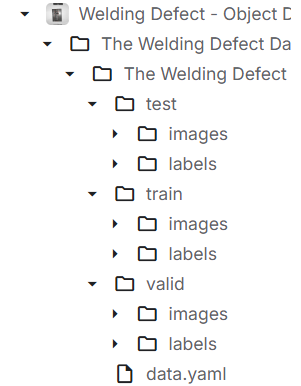

## Preparation

### 1. upload your dataset to Google Drive and mount your google drive to Google Colab
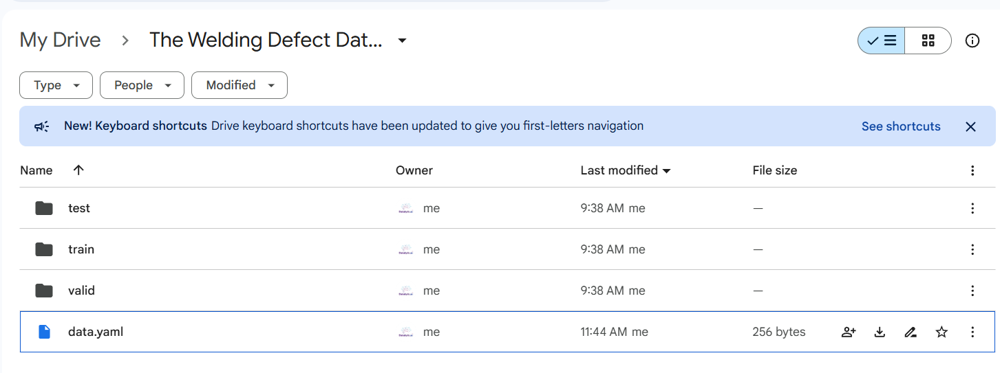

### 2. Install all the necessary libraries and packages and import them

In [ ]:
# Install YOLOv8 and necessary dependencies
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 870.5/870.5 kB 14.2 MB/s eta 0:00:00


In [ ]:
# Import libraries
import os                                   # for interaction w/ OS (CRUD files/dir)
import shutil                               # for moving, removing dir/files especially big dataset
import matplotlib.pyplot as plt             # visualization (graph, chart, img)
import cv2                                  # For computer vision related tasks
                                            # img/vid capture, processing, manipulation + obj/face recog
import random                               # generate random num/choose rand item/shuffle data
from IPython.display import Image, display  # For displaying img
import pandas as pd                         # handling and analyzing structured data
import seaborn as sns                       # provide aesthetic/easier to use plots
from ultralytics import YOLO                # YOLO -> obj detection
                                            # effecent for real-time obj detection

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# wandb(weight and biases) package (for tracking and visualize ML)
!pip install wandb
import wandb

wandb.login(key='eb4c4a1fa7eec1ffbabc36420ba1166f797d4ac5')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 73.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.8/313.8 kB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.0 MB/s eta 0:00:00


wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

### 3. Configure the 'data.yaml' file. **Ensure that your dataset is stored at the same place as mentioned in step 1.**

Open data.yaml and paste this:

```
train: /content/drive/MyDrive/The Welding Defect Dataset/train/images
val: /content/drive/MyDrive/The Welding Defect Dataset/valid/images
test: /content/drive/MyDrive/The Welding Defect Dataset/test/images

nc: 3
names: ['Bad Weld', 'Good Weld', 'Defect']
```

This will help our app in identifying:
1. The location of our images
2. The total classes of our data
3. The name of the classes (optional)
4. Any hyperparameters for our model (optional)

For example, in our data.yaml file, we have set our paths to the images folder for our training, validation and testing images.


# Get started with YOLOv8

Now that we have already done the prerequisites, we can start with using YOLOv8.YOLO has many models but for this specific module we will be using YOLOv8n as it is a pretrained nano model which is a lightweight version that is efficient and provides faster inference.

## 4. Train YOLOv8 model

Use YOLO class from ultralytics where we create an instance of the model and then call the train method

In [ ]:
model = YOLO('yolov8n.pt') # define pretrained YOLOv8n model

# yaml file contains path to images, labels, classes and how data is split for train and validation
# epochs = 100, repeats process 100 times so model learn data better
# imgsz -> size of image that is loaded on to the YOLOv8 model
model.train(data='/content/drive/MyDrive/The Welding Defect Dataset/data.yaml', epochs=100, imgsz=640)

100%|██████████| 6.25M/6.25M [00:00<00:00, 79.6MB/s]


Ultralytics YOLOv8.2.99 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/The Welding Defect Dataset/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_

100%|██████████| 755k/755k [00:00<00:00, 14.5MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Currently logged in as: faf2001f (faf2001f-university-of-engineering-and-technology-taxila). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/The Welding Defect Dataset/train/labels.cache... 835 images, 0 backgrounds, 0 corrupt: 100%|██████████| 835/835 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.16 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/The Welding Defect Dataset/valid/labels.cache... 176 images, 0 backgrounds, 0 corrupt: 100%|██████████| 176/176 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.28G      2.049      3.172       1.72         21        640: 100%|██████████| 53/53 [00:20<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.27it/s]


                   all        176        573      0.615      0.143      0.209      0.095

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.19G      1.886      2.592      1.569         23        640: 100%|██████████| 53/53 [00:08<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.63it/s]

                   all        176        573      0.177      0.304       0.19     0.0894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.21G      1.886      2.497      1.583         23        640: 100%|██████████| 53/53 [00:08<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.95it/s]

                   all        176        573      0.518      0.221      0.163     0.0603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100       2.2G      1.847       2.42      1.584         23        640: 100%|██████████| 53/53 [00:07<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

                   all        176        573      0.548      0.317      0.226      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.22G      1.815      2.296       1.54         20        640: 100%|██████████| 53/53 [00:08<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.88it/s]

                   all        176        573      0.264      0.293      0.216     0.0962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.24G      1.828      2.276      1.559         18        640: 100%|██████████| 53/53 [00:08<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.01it/s]

                   all        176        573      0.328      0.378      0.255      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.21G      1.783      2.198      1.544         24        640: 100%|██████████| 53/53 [00:08<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.20it/s]

                   all        176        573      0.339      0.358      0.311      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.27G      1.728      2.114      1.508         14        640: 100%|██████████| 53/53 [00:08<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.34it/s]

                   all        176        573      0.374      0.417       0.32      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.21G      1.723       2.06      1.493         29        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.11it/s]

                   all        176        573      0.334      0.456      0.304       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       2.2G      1.721      2.029      1.488         15        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.33it/s]

                   all        176        573      0.412      0.393      0.352      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.23G      1.694      2.006      1.494         29        640: 100%|██████████| 53/53 [00:08<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.94it/s]

                   all        176        573      0.415      0.468       0.37       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       2.2G      1.674      1.961      1.461         26        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.37it/s]

                   all        176        573      0.687      0.393      0.394        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       2.2G      1.683      1.944      1.474         17        640: 100%|██████████| 53/53 [00:08<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.29it/s]

                   all        176        573      0.391      0.415      0.361      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.29G      1.692      1.927      1.468         22        640: 100%|██████████| 53/53 [00:08<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.17it/s]

                   all        176        573      0.444      0.484      0.353      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.24G      1.638      1.836      1.438         15        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.48it/s]

                   all        176        573      0.398      0.407       0.34      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.23G      1.643      1.879      1.435         34        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.99it/s]

                   all        176        573      0.377      0.494      0.421      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.21G      1.615      1.811      1.428         22        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.43it/s]

                   all        176        573      0.443      0.471      0.413       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.22G      1.584      1.781      1.417         17        640: 100%|██████████| 53/53 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.34it/s]

                   all        176        573      0.405      0.461      0.394       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.21G      1.568      1.766      1.421          9        640: 100%|██████████| 53/53 [00:08<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.11it/s]

                   all        176        573      0.449      0.487      0.439      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.21G        1.6      1.765      1.427         19        640: 100%|██████████| 53/53 [00:08<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.35it/s]

                   all        176        573      0.475      0.448      0.418      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       2.2G      1.574      1.749      1.408         21        640: 100%|██████████| 53/53 [00:08<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.37it/s]

                   all        176        573      0.484      0.485       0.41      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.25G      1.551      1.721      1.398         23        640: 100%|██████████| 53/53 [00:08<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.60it/s]

                   all        176        573      0.502      0.489      0.459      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.25G      1.531      1.697      1.385         39        640: 100%|██████████| 53/53 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.25it/s]

                   all        176        573      0.551      0.507      0.465      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.21G      1.536      1.702      1.391         24        640: 100%|██████████| 53/53 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.03it/s]

                   all        176        573      0.478       0.46      0.433      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.21G      1.543      1.675      1.391         14        640: 100%|██████████| 53/53 [00:08<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.36it/s]

                   all        176        573      0.468      0.497      0.448      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.23G      1.533      1.657      1.386         13        640: 100%|██████████| 53/53 [00:08<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.11it/s]

                   all        176        573      0.463      0.494      0.444      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       2.2G      1.509      1.636       1.38         12        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.57it/s]

                   all        176        573      0.515      0.506      0.471      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.22G      1.484      1.615      1.357         34        640: 100%|██████████| 53/53 [00:08<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.18it/s]

                   all        176        573      0.492      0.534      0.483      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.26G      1.522      1.623      1.377         15        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.56it/s]

                   all        176        573      0.501       0.51      0.467      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.29G      1.485       1.57      1.353         14        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.62it/s]

                   all        176        573      0.463      0.539      0.478      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.24G      1.489      1.607      1.359         25        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.13it/s]

                   all        176        573       0.51      0.504      0.487      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.21G      1.501      1.585      1.363         29        640: 100%|██████████| 53/53 [00:08<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.41it/s]

                   all        176        573      0.579      0.445      0.471      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.21G      1.463      1.516       1.33         14        640: 100%|██████████| 53/53 [00:08<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.29it/s]

                   all        176        573      0.494      0.546      0.509       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.23G      1.456      1.509      1.332         15        640: 100%|██████████| 53/53 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.26it/s]

                   all        176        573      0.434      0.533      0.471       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.26G      1.473      1.532      1.356         10        640: 100%|██████████| 53/53 [00:08<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.42it/s]

                   all        176        573      0.496      0.523      0.489      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.22G      1.431      1.462      1.306         18        640: 100%|██████████| 53/53 [00:08<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.27it/s]

                   all        176        573       0.52      0.504      0.488      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       2.2G      1.427      1.452      1.323         17        640: 100%|██████████| 53/53 [00:08<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.55it/s]

                   all        176        573      0.452      0.547      0.496      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.23G      1.435      1.476       1.32         22        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.24it/s]

                   all        176        573      0.536      0.495      0.502      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.24G       1.42       1.46      1.318         23        640: 100%|██████████| 53/53 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.46it/s]

                   all        176        573      0.539      0.498      0.465      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.24G      1.405      1.419      1.296         13        640: 100%|██████████| 53/53 [00:08<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.56it/s]

                   all        176        573      0.564      0.499      0.489       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.21G      1.399      1.388      1.295          8        640: 100%|██████████| 53/53 [00:08<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.27it/s]

                   all        176        573      0.493      0.569      0.515      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.29G       1.39      1.365      1.284          9        640: 100%|██████████| 53/53 [00:08<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.44it/s]

                   all        176        573      0.494      0.554      0.494      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.21G        1.4       1.38      1.302         23        640: 100%|██████████| 53/53 [00:08<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.16it/s]

                   all        176        573      0.504       0.53      0.509      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.23G      1.384      1.339      1.272         21        640: 100%|██████████| 53/53 [00:08<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.42it/s]

                   all        176        573      0.579      0.541      0.514      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.28G      1.372      1.347      1.284         23        640: 100%|██████████| 53/53 [00:08<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.46it/s]

                   all        176        573      0.548      0.511      0.508      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       2.2G      1.365      1.325      1.278         10        640: 100%|██████████| 53/53 [00:08<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.69it/s]

                   all        176        573      0.531      0.531      0.497      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.24G      1.337      1.288      1.258         24        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.62it/s]

                   all        176        573      0.603      0.542      0.546      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.21G      1.324      1.268      1.247         18        640: 100%|██████████| 53/53 [00:08<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.22it/s]

                   all        176        573       0.61      0.554      0.554      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.23G       1.37      1.334      1.291         15        640: 100%|██████████| 53/53 [00:08<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.47it/s]

                   all        176        573      0.515      0.561      0.532      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.21G      1.333      1.303      1.254         14        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.23it/s]

                   all        176        573      0.594      0.517      0.539       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.23G      1.333       1.27      1.266         19        640: 100%|██████████| 53/53 [00:08<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.54it/s]

                   all        176        573      0.567      0.555      0.535      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.23G      1.347      1.285      1.273         16        640: 100%|██████████| 53/53 [00:08<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.37it/s]

                   all        176        573      0.601      0.509       0.53      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.21G      1.337      1.264      1.266         17        640: 100%|██████████| 53/53 [00:08<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.50it/s]

                   all        176        573      0.602      0.534      0.556       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.29G      1.327      1.233      1.252         41        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.49it/s]

                   all        176        573      0.613      0.553      0.553      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.24G      1.309      1.218      1.243         12        640: 100%|██████████| 53/53 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.22it/s]

                   all        176        573      0.512       0.58      0.541      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.21G      1.308      1.245      1.243         42        640: 100%|██████████| 53/53 [00:08<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.66it/s]

                   all        176        573      0.611      0.522      0.554      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.21G      1.295      1.232      1.242         14        640: 100%|██████████| 53/53 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.58it/s]

                   all        176        573       0.65      0.518      0.558      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.19G      1.294      1.191      1.228         26        640: 100%|██████████| 53/53 [00:08<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.28it/s]

                   all        176        573      0.646      0.549      0.577      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.23G      1.278      1.181      1.224         11        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.58it/s]

                   all        176        573      0.566      0.561      0.552      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.21G      1.298      1.192      1.232         13        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.20it/s]

                   all        176        573      0.578      0.571      0.561      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.26G       1.28       1.18      1.213         18        640: 100%|██████████| 53/53 [00:08<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.37it/s]

                   all        176        573       0.54      0.577      0.546      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.22G      1.282      1.179       1.22         30        640: 100%|██████████| 53/53 [00:08<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.47it/s]

                   all        176        573       0.61       0.57      0.559      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.24G      1.251      1.147      1.214         13        640: 100%|██████████| 53/53 [00:08<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.55it/s]

                   all        176        573      0.619      0.581      0.574      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100       2.2G      1.258       1.16      1.207         26        640: 100%|██████████| 53/53 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.59it/s]

                   all        176        573      0.617      0.575      0.571      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.26G      1.245      1.137      1.211         35        640: 100%|██████████| 53/53 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.39it/s]

                   all        176        573      0.564      0.606      0.565      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       2.3G      1.239      1.134      1.199         15        640: 100%|██████████| 53/53 [00:08<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.64it/s]

                   all        176        573      0.622      0.572        0.6      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.21G      1.246      1.124      1.206         19        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.23it/s]

                   all        176        573      0.623      0.569       0.57      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.24G      1.214      1.099      1.192         26        640: 100%|██████████| 53/53 [00:08<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.54it/s]

                   all        176        573      0.593      0.564       0.58      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.21G      1.212      1.116      1.187         12        640: 100%|██████████| 53/53 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.68it/s]

                   all        176        573      0.622      0.564      0.571      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       2.2G       1.22       1.09      1.199         26        640: 100%|██████████| 53/53 [00:08<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.38it/s]

                   all        176        573      0.587       0.61      0.597      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.27G      1.214      1.087       1.19         11        640: 100%|██████████| 53/53 [00:08<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.36it/s]

                   all        176        573      0.645      0.569        0.6      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.24G      1.195      1.063       1.18         19        640: 100%|██████████| 53/53 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.42it/s]

                   all        176        573      0.621      0.607      0.592      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.24G      1.204      1.064      1.185         18        640: 100%|██████████| 53/53 [00:08<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.72it/s]

                   all        176        573       0.66      0.552      0.581      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.23G      1.206      1.068      1.176          7        640: 100%|██████████| 53/53 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.66it/s]

                   all        176        573      0.638      0.591      0.607       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.22G      1.193      1.054      1.183         23        640: 100%|██████████| 53/53 [00:08<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.42it/s]

                   all        176        573      0.657      0.571        0.6      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.21G      1.187      1.039      1.176         17        640: 100%|██████████| 53/53 [00:08<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.72it/s]

                   all        176        573      0.663      0.586      0.603      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.21G      1.181      1.023      1.168         17        640: 100%|██████████| 53/53 [00:08<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.28it/s]

                   all        176        573      0.672      0.588      0.619      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.25G      1.168      1.028      1.153         19        640: 100%|██████████| 53/53 [00:08<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.73it/s]

                   all        176        573      0.607      0.617      0.589      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.24G      1.161      1.022      1.153         19        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.22it/s]

                   all        176        573      0.614      0.599      0.599      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.24G      1.154       1.01      1.155         13        640: 100%|██████████| 53/53 [00:08<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.52it/s]

                   all        176        573      0.592      0.609      0.596      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100       2.2G      1.166      1.014      1.152         18        640: 100%|██████████| 53/53 [00:08<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.60it/s]

                   all        176        573      0.673      0.559      0.588      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.28G      1.161      1.022      1.172         13        640: 100%|██████████| 53/53 [00:08<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.40it/s]

                   all        176        573      0.624      0.588      0.592       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.25G      1.156      1.018      1.164         11        640: 100%|██████████| 53/53 [00:08<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.70it/s]

                   all        176        573      0.665      0.585      0.598      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.21G      1.142     0.9975      1.158         14        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.14it/s]

                   all        176        573      0.682      0.574      0.612      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.21G       1.13     0.9802      1.154         13        640: 100%|██████████| 53/53 [00:08<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.64it/s]

                   all        176        573      0.624      0.627      0.604      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.19G      1.133     0.9768      1.143          8        640: 100%|██████████| 53/53 [00:08<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.31it/s]

                   all        176        573      0.641      0.614      0.617      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.21G       1.13      0.963      1.142         11        640: 100%|██████████| 53/53 [00:08<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.38it/s]

                   all        176        573      0.612      0.633      0.603      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.24G      1.127     0.9514      1.142         19        640: 100%|██████████| 53/53 [00:08<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.61it/s]

                   all        176        573       0.68      0.567      0.597       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       2.2G       1.11     0.9447      1.142         20        640: 100%|██████████| 53/53 [00:08<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.36it/s]

                   all        176        573      0.686      0.593      0.607      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.26G      1.111     0.9602      1.132         24        640: 100%|██████████| 53/53 [00:08<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.47it/s]

                   all        176        573      0.624      0.608      0.595      0.349


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.21G      1.052     0.8974      1.141         12        640: 100%|██████████| 53/53 [00:09<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.68it/s]

                   all        176        573      0.636      0.616       0.61      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.23G      1.043     0.8723      1.134          9        640: 100%|██████████| 53/53 [00:07<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.48it/s]

                   all        176        573      0.625      0.631      0.606      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       2.2G      1.021     0.8536      1.136          9        640: 100%|██████████| 53/53 [00:08<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.84it/s]

                   all        176        573      0.637      0.631       0.62      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.28G      1.016     0.8434      1.134         17        640: 100%|██████████| 53/53 [00:08<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.44it/s]

                   all        176        573       0.66      0.619      0.614       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.21G      1.008     0.8171      1.124         11        640: 100%|██████████| 53/53 [00:07<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.58it/s]

                   all        176        573      0.656      0.619      0.622      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       2.2G     0.9951     0.8136      1.118          4        640: 100%|██████████| 53/53 [00:08<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.59it/s]

                   all        176        573      0.664      0.615      0.626      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.18G      1.011      0.831      1.136          6        640: 100%|██████████| 53/53 [00:07<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.67it/s]

                   all        176        573      0.642      0.642      0.628      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       2.2G     0.9868      0.807      1.114          8        640: 100%|██████████| 53/53 [00:08<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.72it/s]

                   all        176        573      0.682       0.62      0.614      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       2.2G     0.9548     0.7766      1.099          4        640: 100%|██████████| 53/53 [00:07<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.47it/s]

                   all        176        573      0.653      0.639      0.621      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100       2.2G     0.9642     0.7908      1.091         12        640: 100%|██████████| 53/53 [00:08<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.71it/s]

                   all        176        573      0.661      0.636      0.625      0.369



100 epochs completed in 0.282 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.99 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.03it/s]


                   all        176        573      0.642      0.641      0.627      0.373
              Bad Weld         87        127      0.607      0.778      0.693      0.441
             Good Weld        119        253      0.708      0.715      0.746      0.488
                Defect         90        193       0.61      0.429      0.442      0.189
Speed: 0.2ms preprocess, 2.0ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃██▇▇▇▆▆▆▆▆▆▆▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁
lr/pg1,███▇▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁
lr/pg2,███▇▇▇▇▆▆▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▂▂▃▃▄▅▅▅▆▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇█▇▇████████████
metrics/mAP50-95(B),▂▁▂▃▄▅▄▅▄▅▅▅▆▅▆▆▅▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇███▇▇███
metrics/precision(B),▄▅▁▂█▂▃▃▃▄▄▃▆▅▄▅▅▆▅▆▇▅▆▅▆▆▇▆▇█▆██▇█▇▇▇█▇
metrics/recall(B),▁▃▃▃▄▅▅▆▅▆▅▆▆▅▆▆▆▆▆▇▆▆▇▇▇▇▇▇▇▇▇▇▇█▇█████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bdd734e3370>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

## 5. Locate the best.pt file which is the finetuned model and download it.

The best.pt file is usually stored in *'runs/detect/train/weights/best.pt'* which is mentioned after the training process ends as shown in the image below. This *best.pt* file is a **finetuned YOLOv8n model** which is now able to recognize welding defects.

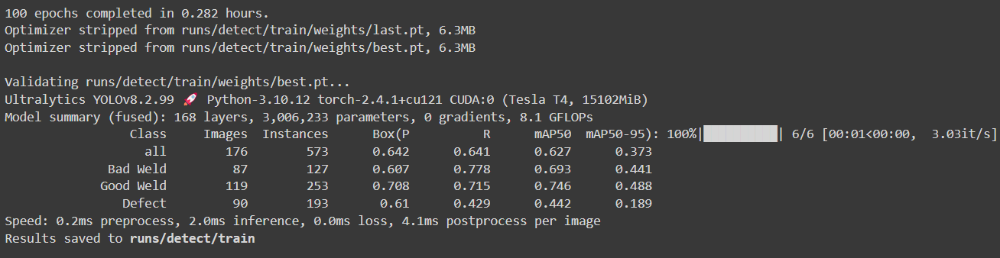

## 6. Upload the file to Google Drive

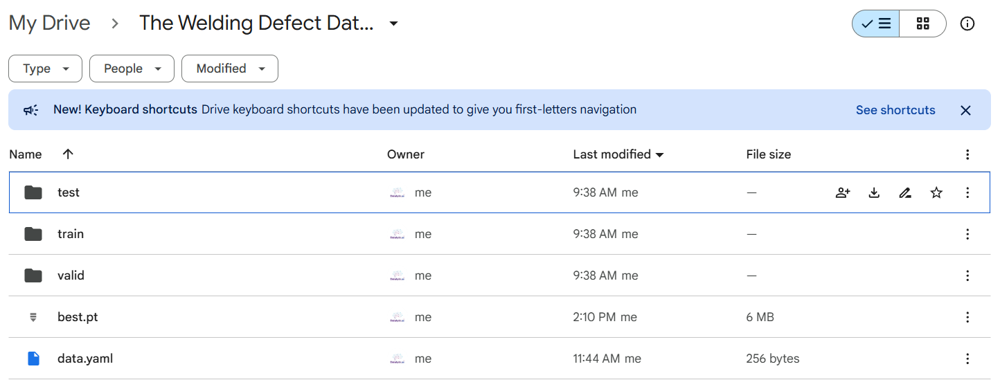

## 7. Test on new data

### 7.1 Load finetuned model

In [ ]:
# load finetuned model
model_ft_path = '/content/drive/MyDrive/The Welding Defect Dataset/best.pt' # replace the path with the path of the 'best.pt' file that you have uploaded
                                                                            # this will let the code know that the path to our new finetuned YOLOv8 is here
model_ft = YOLO(model_ft_path) # load finetuned YOLOv8n so we can use it for detection

### 7.2 Define image path and use finetuned model to predict on image.

In [ ]:
# Specifying path to image that will be used for testing
image_path = '/content/drive/MyDrive/The Welding Defect Dataset/test/images/Good-Welding-images_33_jpeg_jpg.rf.782ccc0dfca926b946a6b664dd4cacd1.jpg'
# Uses finetuned model to detect welding defect that is in the image in 'image_path'
results = model_ft.predict(source=image_path)



image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Good-Welding-images_33_jpeg_jpg.rf.782ccc0dfca926b946a6b664dd4cacd1.jpg: 640x640 1 Good Weld, 499.5ms
Speed: 12.7ms preprocess, 499.5ms inference, 27.8ms postprocess per image at shape (1, 3, 640, 640)


### 7.3 Visualize the detection by putting a bounding box around the image

For the bounding box, we have set so that the color will be as follows:
- Good weld: Green
- Bad weld: Blue
- Defect: Red


image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid233_jpeg_jpg.rf.17d61563d86c4d1fc157c29f5a109d98.jpg: 640x640 1 Bad Weld, 567.5ms
Speed: 3.3ms preprocess, 567.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


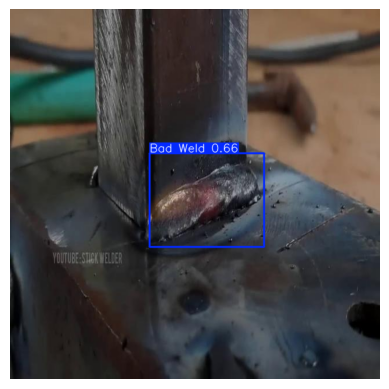

Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good-tig-welds_4_jpeg_jpg.rf.3e3a5bbd002257f6e3845eaecef98355.jpg: 640x640 1 Good Weld, 384.5ms
Speed: 33.8ms preprocess, 384.5ms inference, 19.5ms postprocess per image at shape (1, 3, 640, 640)


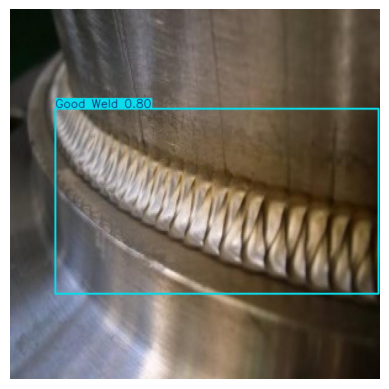

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Good-Welding-images_12_jpeg_jpg.rf.9fa5a26596733b74baf1f974b8210c28.jpg: 640x640 2 Good Welds, 208.0ms
Speed: 3.0ms preprocess, 208.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


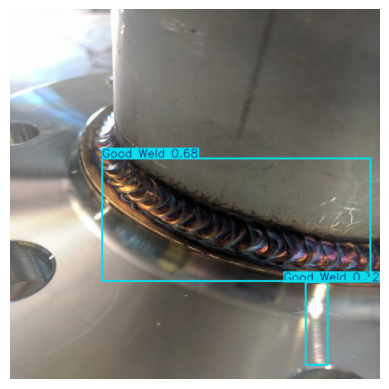

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good-stick-welds_19_png_jpg.rf.dc807e5b52e58b41c2c3c1dd6b833ec8.jpg: 640x640 9 Good Welds, 230.2ms
Speed: 3.1ms preprocess, 230.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


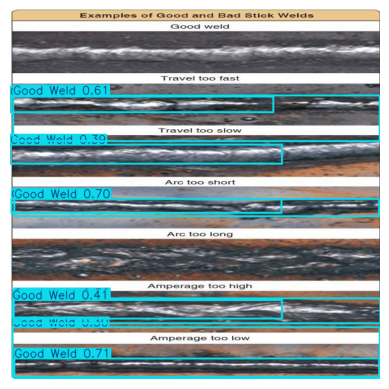

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid397_jpeg_jpg.rf.6aacbe170c5956e56b1024f24d60c60c.jpg: 640x640 1 Bad Weld, 1 Good Weld, 1 Defect, 239.9ms
Speed: 3.0ms preprocess, 239.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


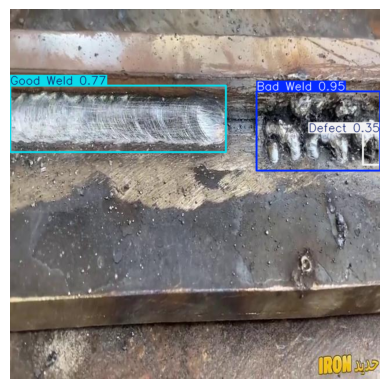

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good-stick-welds_38_jpeg_jpg.rf.a798a6f14879da205dac297a653d167f.jpg: 640x640 2 Good Welds, 251.8ms
Speed: 3.1ms preprocess, 251.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


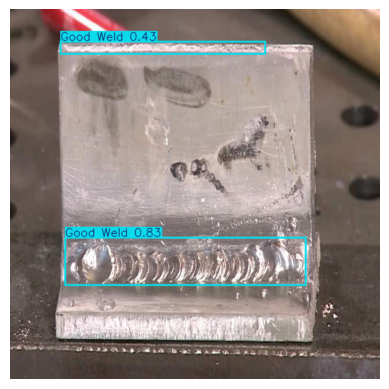

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/carbon-steel-good-welds_28_png_jpg.rf.0d13b8fd981d7a68d163528d61a2e534.jpg: 640x640 (no detections), 207.2ms
Speed: 3.2ms preprocess, 207.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


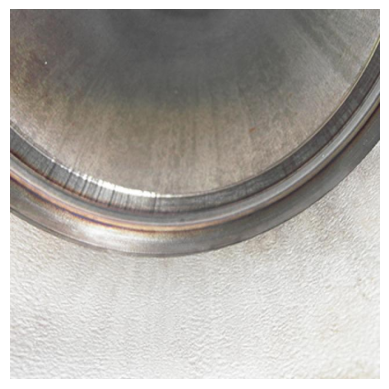


image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good-tig-welds_32_png_jpg.rf.31e47557dc8768f6a9dd99627ca3a6e7.jpg: 640x640 1 Good Weld, 369.8ms
Speed: 6.7ms preprocess, 369.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


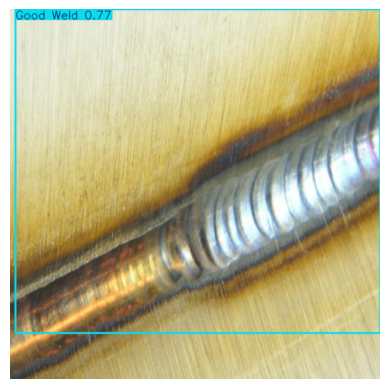

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Good-Welding-images_17_jpeg_jpg.rf.be58c70a9f7f542fc89cb48847776741.jpg: 640x640 3 Bad Welds, 1 Defect, 364.4ms
Speed: 3.0ms preprocess, 364.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


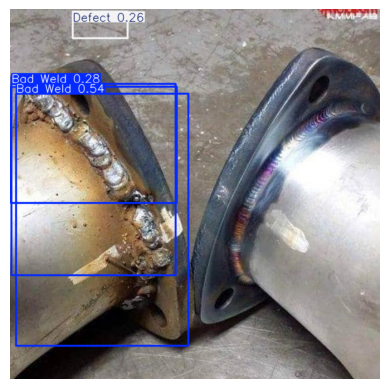

Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid166_jpeg_jpg.rf.525052424b574a43de777660f6cb2d10.jpg: 640x640 1 Bad Weld, 361.8ms
Speed: 5.5ms preprocess, 361.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


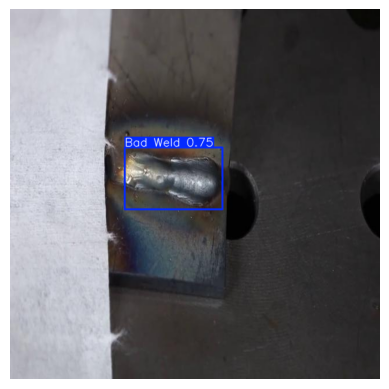

Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/4a05306b-ca866e1f-c12_jpg.rf.c5c926823394e6056b533bedd6e64c99.jpg: 640x640 1 Bad Weld, 1 Good Weld, 347.1ms
Speed: 2.9ms preprocess, 347.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


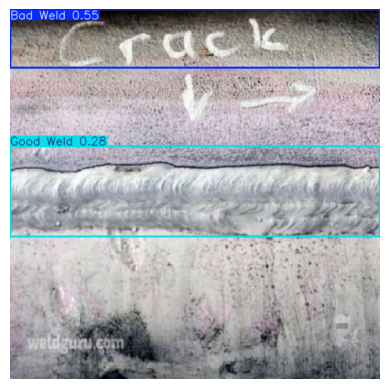

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/02fd0af7-51ab46bb-c13_jpg.rf.7de08cd3b264d9098d09f5fe6d21c959.jpg: 640x640 (no detections), 350.9ms
Speed: 2.9ms preprocess, 350.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


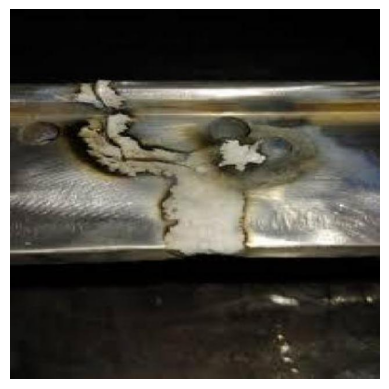


image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good-tig-welds_23_jpeg_jpg.rf.1513147f7df61d6a13bedd62c03c846e.jpg: 640x640 2 Good Welds, 360.4ms
Speed: 7.1ms preprocess, 360.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


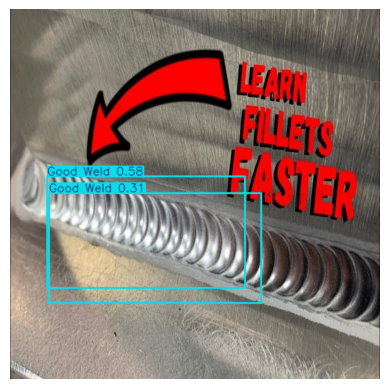

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid84_jpeg_jpg.rf.f148c4898a835b73a3eb087d905ed8f3.jpg: 640x640 1 Bad Weld, 1 Good Weld, 355.7ms
Speed: 2.8ms preprocess, 355.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


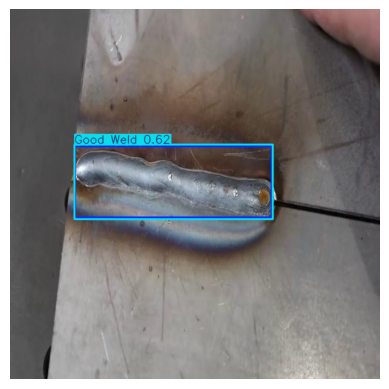

Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/295992d6-f617b725-c1_png_jpg.rf.5f645e13f1695df588b0644ca9702c43.jpg: 640x640 (no detections), 373.1ms
Speed: 11.2ms preprocess, 373.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


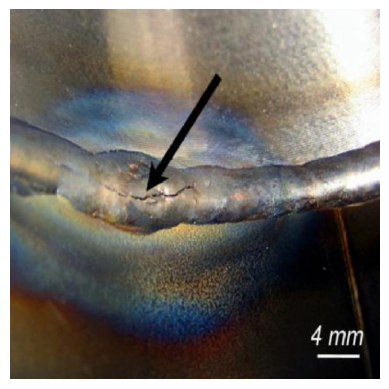


image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid89_jpeg_jpg.rf.cdeeae57ff588da1b969bfd75c2a7747.jpg: 640x640 1 Bad Weld, 342.6ms
Speed: 3.9ms preprocess, 342.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


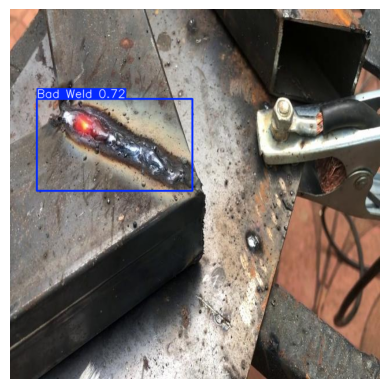

Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/crack-welding-images_17_jpeg_jpg.rf.ff570716da313da84983bc629ae7e331.jpg: 640x640 1 Defect, 264.5ms
Speed: 5.8ms preprocess, 264.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


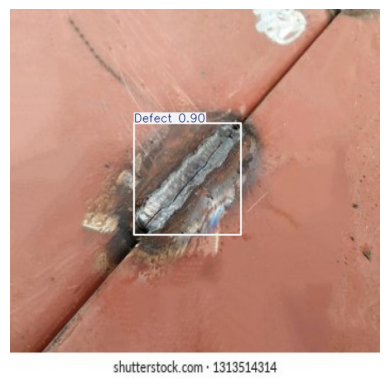

Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid261_jpeg_jpg.rf.5ae3866fd5de7b144659fa7f7b92c5ba.jpg: 640x640 1 Bad Weld, 2 Good Welds, 1 Defect, 250.1ms
Speed: 6.4ms preprocess, 250.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


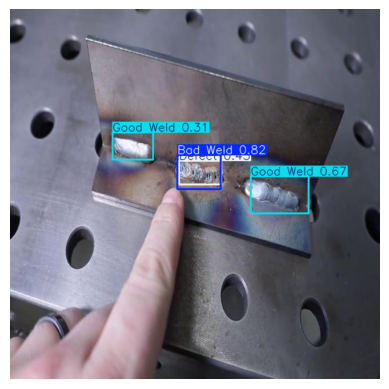

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid374_jpeg_jpg.rf.d1c904ca6a097b2c51665238ba9e1147.jpg: 640x640 1 Bad Weld, 1 Defect, 245.5ms
Speed: 5.1ms preprocess, 245.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


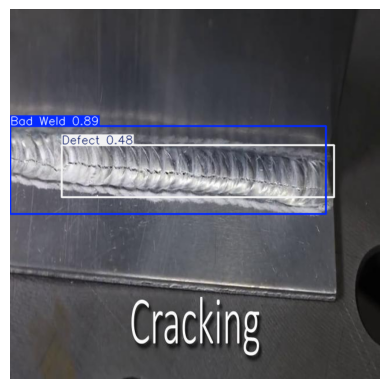

Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid643_jpeg_jpg.rf.4198326c850625e57e8851f1da196032.jpg: 640x640 1 Bad Weld, 273.1ms
Speed: 4.9ms preprocess, 273.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


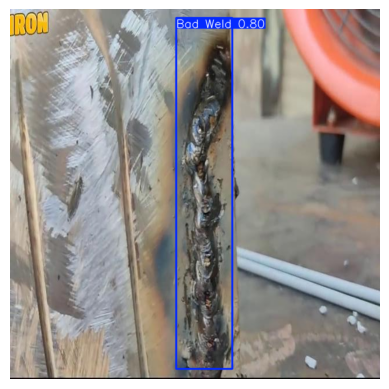

Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid277_jpeg_jpg.rf.0e6aafa2605c842edfaedaba06ded02c.jpg: 640x640 1 Bad Weld, 1 Good Weld, 249.8ms
Speed: 6.4ms preprocess, 249.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


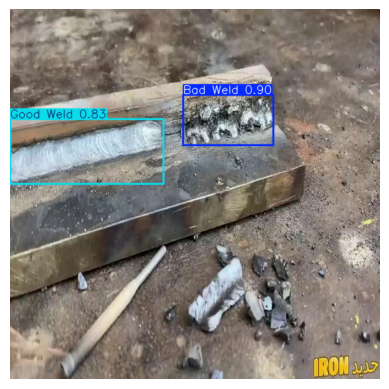

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/1aa4b44c-d01b8a11-Hot-crack_jpg.rf.57393ca7936f061ca5991481b2b5c485.jpg: 640x640 1 Defect, 280.9ms
Speed: 3.2ms preprocess, 280.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


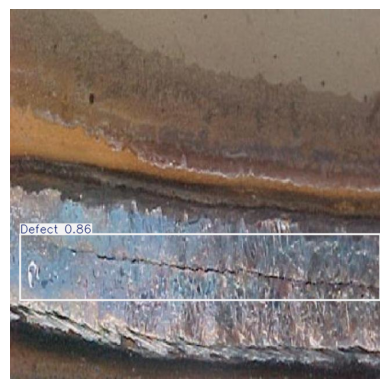

Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/crack-welding-images_11_jpeg_jpg.rf.5174724ff08d893dc926840b5d3a3e22.jpg: 640x640 2 Bad Welds, 259.3ms
Speed: 6.1ms preprocess, 259.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


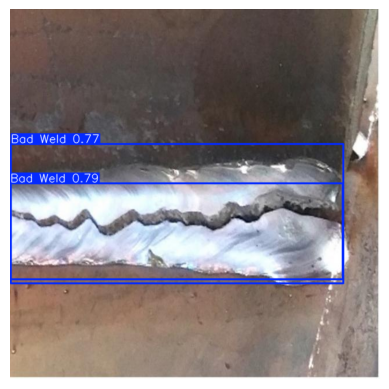

Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/bad_weld_vid278_jpeg_jpg.rf.d7b37caf0f75a2942cae27dedf5c4c64.jpg: 640x640 1 Bad Weld, 1 Good Weld, 305.3ms
Speed: 2.9ms preprocess, 305.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


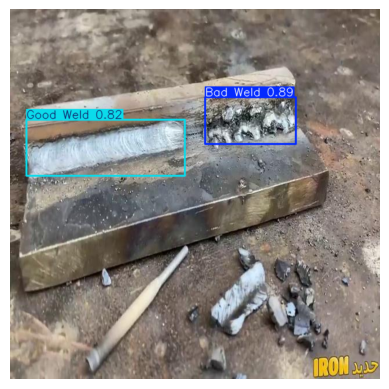

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_2_mp4-39_jpg.rf.e18c2b9f47afa039f3f2fee002312552.jpg: 640x640 3 Bad Welds, 3 Good Welds, 4 Defects, 298.0ms
Speed: 6.1ms preprocess, 298.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


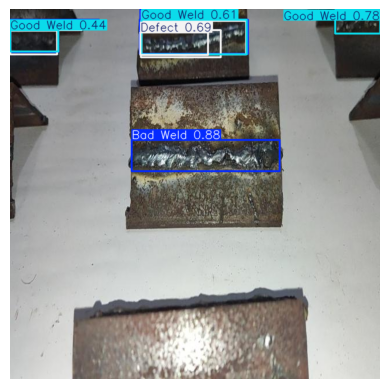

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Screenshot-2022-12-05-230257_jpeg_jpg.rf.b7d7eb8e010e48641638d6a878f9af61.jpg: 640x640 2 Bad Welds, 272.5ms
Speed: 4.8ms preprocess, 272.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


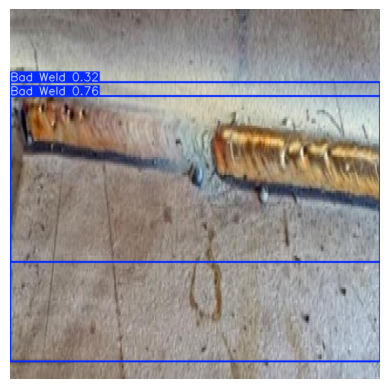

Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid104_jpeg_jpg.rf.892dcfa6c4ff7737002a45507ebace2b.jpg: 640x640 2 Good Welds, 300.4ms
Speed: 9.6ms preprocess, 300.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


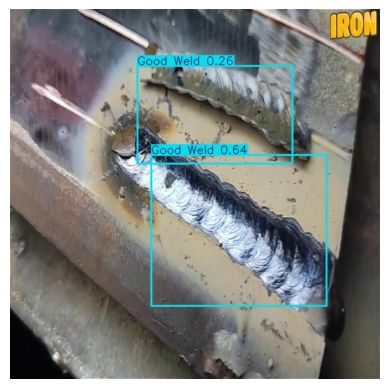

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_2_mp4-24_jpg.rf.0909700c29763d6bbe0f3e7df949475b.jpg: 640x640 3 Bad Welds, 2 Good Welds, 5 Defects, 277.2ms
Speed: 5.0ms preprocess, 277.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


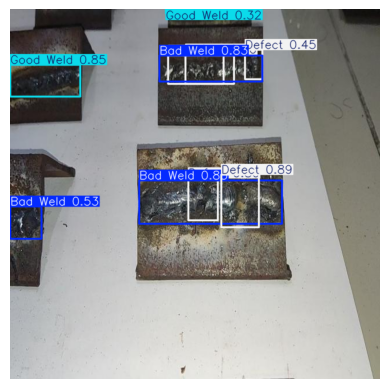

Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid1134_jpeg_jpg.rf.5531f5eb2fc03e6b2b992469c012caa4.jpg: 640x640 3 Good Welds, 254.7ms
Speed: 3.1ms preprocess, 254.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


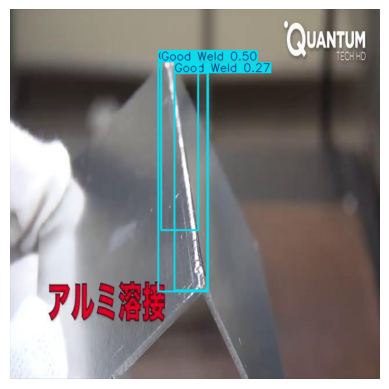

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV3_1_mp4-50_jpg.rf.5a367e6d492cd43c4a8627799b654370.jpg: 640x640 1 Bad Weld, 3 Good Welds, 1 Defect, 303.2ms
Speed: 4.4ms preprocess, 303.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


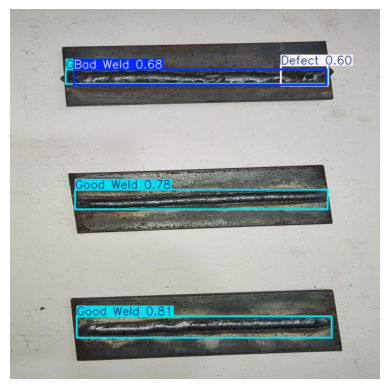

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/mig-good-welds_11_jpeg_jpg.rf.c488ebd180387fc1f20114bed459fbb5.jpg: 640x640 3 Bad Welds, 1 Good Weld, 294.8ms
Speed: 3.3ms preprocess, 294.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


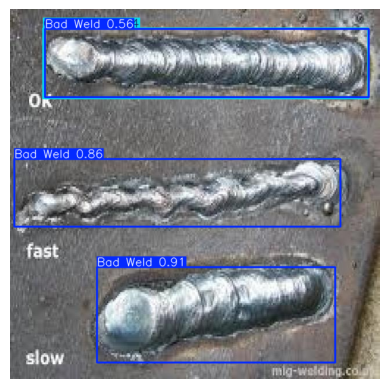

Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid189_jpeg_jpg.rf.33380af68fa3c4f459a81f26d1bdbcb9.jpg: 640x640 1 Good Weld, 324.5ms
Speed: 5.5ms preprocess, 324.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


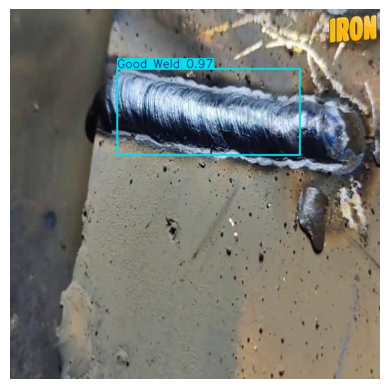

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_2_mp4-100_jpg.rf.95c9ff940b64d347919b6d49dfb8b0b3.jpg: 640x640 2 Bad Welds, 2 Good Welds, 1 Defect, 389.9ms
Speed: 3.0ms preprocess, 389.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


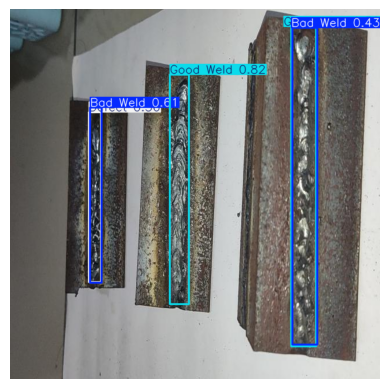

Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV3_1_mp4-24_jpg.rf.017f90fdc7b6c9677febabbd168597fb.jpg: 640x640 1 Bad Weld, 1 Good Weld, 2 Defects, 396.4ms
Speed: 2.9ms preprocess, 396.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


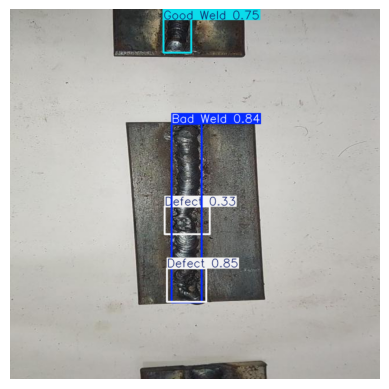

Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV1_2_mp4-14_jpg.rf.4dba7e8bd84314a155dd85df33b5f4d9.jpg: 640x640 1 Bad Weld, 2 Good Welds, 388.9ms
Speed: 3.0ms preprocess, 388.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


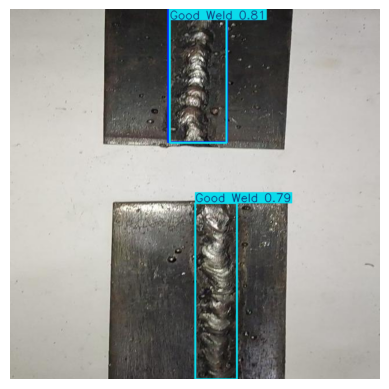

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_2_mp4-71_jpg.rf.de0eaa495c44a7817fab26c6c6277796.jpg: 640x640 1 Bad Weld, 3 Good Welds, 1 Defect, 361.7ms
Speed: 3.0ms preprocess, 361.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


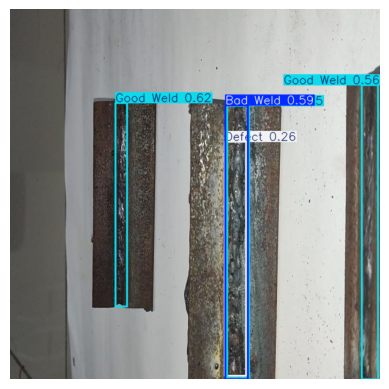

Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV1_1_mp4-42_jpg.rf.6e68d9186e630ffb996233ad2a593f51.jpg: 640x640 2 Bad Welds, 2 Good Welds, 4 Defects, 348.1ms
Speed: 4.3ms preprocess, 348.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


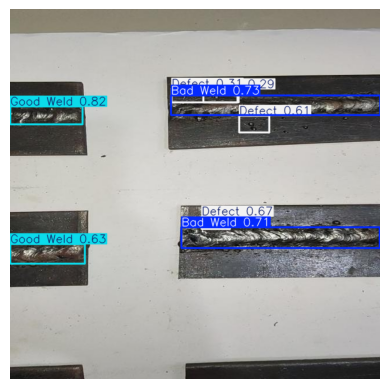

Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_2_mp4-57_jpg.rf.95a7afd6a5fef7ea6a6161a433182ce3.jpg: 640x640 1 Good Weld, 330.5ms
Speed: 3.0ms preprocess, 330.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


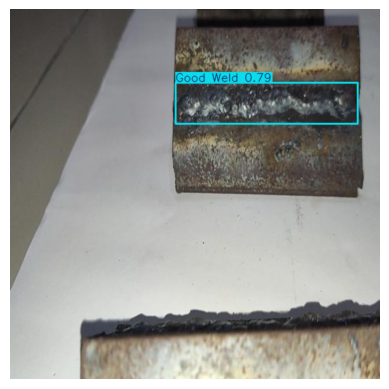

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/poor-Welding-Images_8_jpeg_jpg.rf.b9316d294ddc2466e9565069260103d0.jpg: 640x640 1 Bad Weld, 2 Good Welds, 341.8ms
Speed: 3.3ms preprocess, 341.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


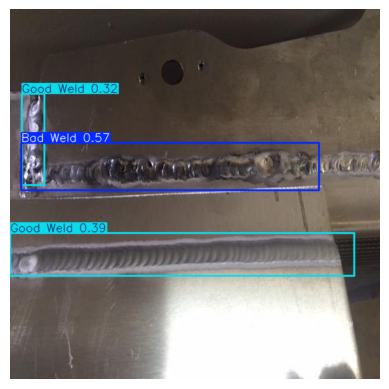

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid1090_jpeg_jpg.rf.7699ffefea4a937a0b9620b4ad77b6d2.jpg: 640x640 (no detections), 343.3ms
Speed: 3.0ms preprocess, 343.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


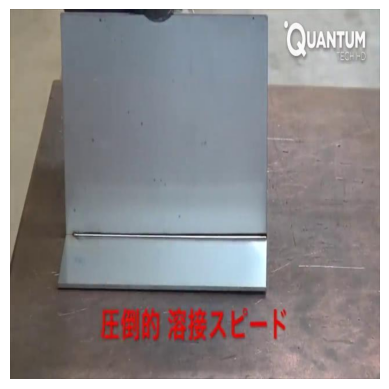


image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid863_jpeg_jpg.rf.9e85aba7b2a24a1cd973afa34c9278c0.jpg: 640x640 1 Good Weld, 352.6ms
Speed: 3.3ms preprocess, 352.6ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)


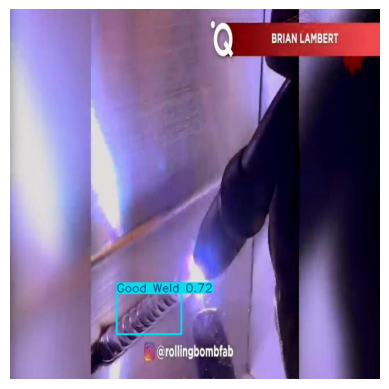

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Spatters-welding-images_30_jpeg_jpg.rf.ac1f61755f14395f6e5da156c7fd043f.jpg: 640x640 2 Bad Welds, 362.1ms
Speed: 6.7ms preprocess, 362.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


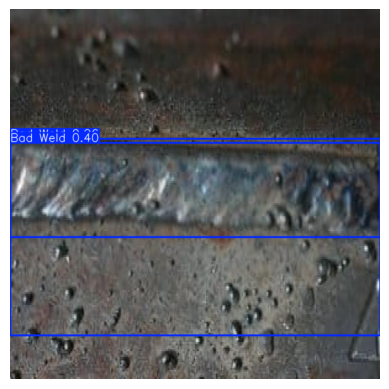

Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid634_jpeg_jpg.rf.9b7bc6b6e69b54eb707c9bab8857b7a1.jpg: 640x640 1 Good Weld, 320.0ms
Speed: 7.1ms preprocess, 320.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


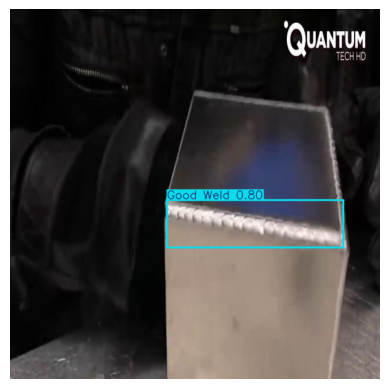

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid95_jpeg_jpg.rf.fb5e83f9ec7edfd902f8d1e715fcb83a.jpg: 640x640 1 Good Weld, 385.5ms
Speed: 3.2ms preprocess, 385.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


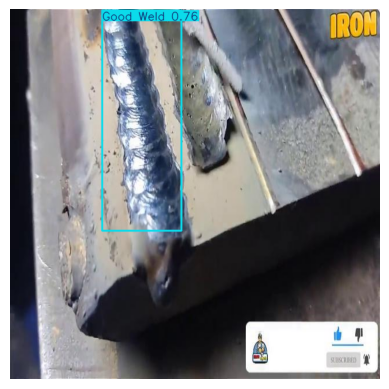

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid505_jpeg_jpg.rf.45b33c7999793e28cfd56029c6f5d0fd.jpg: 640x640 1 Good Weld, 332.1ms
Speed: 10.2ms preprocess, 332.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


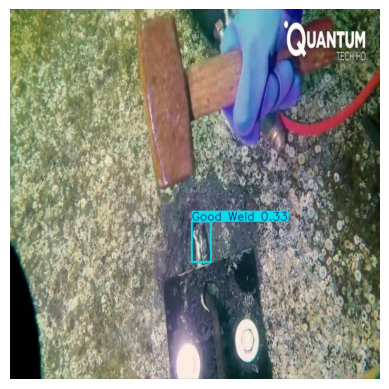

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV3_1_mp4-45_jpg.rf.a4085868c8ba207b4e9941d0af06c894.jpg: 640x640 1 Bad Weld, 1 Good Weld, 1 Defect, 334.3ms
Speed: 6.6ms preprocess, 334.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


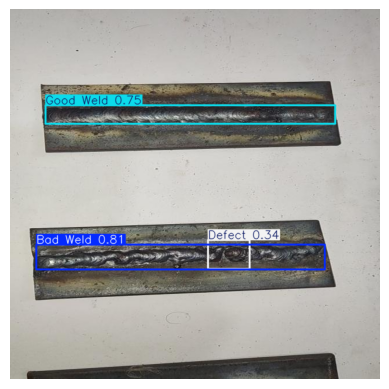

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Screenshot-2022-12-05-223616_jpeg_jpg.rf.ed5db415112db98336eb0a6eabfe3fd0.jpg: 640x640 1 Bad Weld, 1 Good Weld, 298.9ms
Speed: 6.9ms preprocess, 298.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


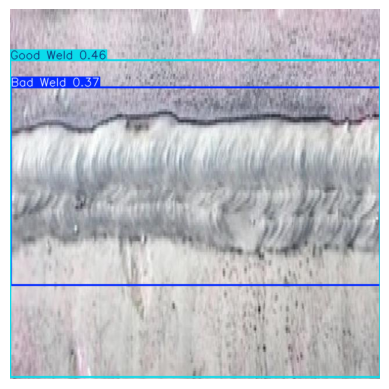

Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/poor-Welding-Images_22_jpeg_jpg.rf.3706f7e9a367ae053abfee4902a78288.jpg: 640x640 2 Bad Welds, 1 Good Weld, 363.8ms
Speed: 6.0ms preprocess, 363.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


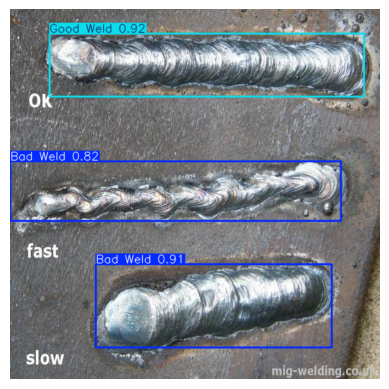

Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_2_mp4-98_jpg.rf.83b6e5f3fa68582da8fe9db065a00a98.jpg: 640x640 3 Bad Welds, 2 Good Welds, 2 Defects, 309.8ms
Speed: 7.0ms preprocess, 309.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


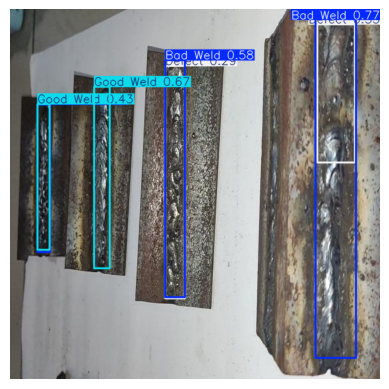

Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Screenshot-2022-12-05-223445_jpeg_jpg.rf.e35a047d0ee08846662cb19b302fb1a7.jpg: 640x640 1 Bad Weld, 45 Defects, 319.6ms
Speed: 6.3ms preprocess, 319.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


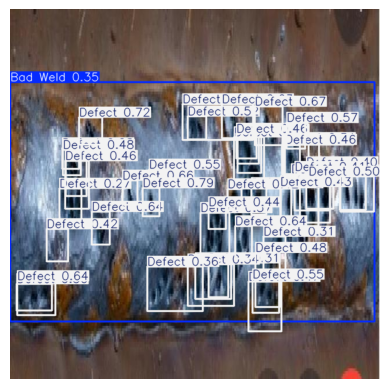

Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Bad Wel

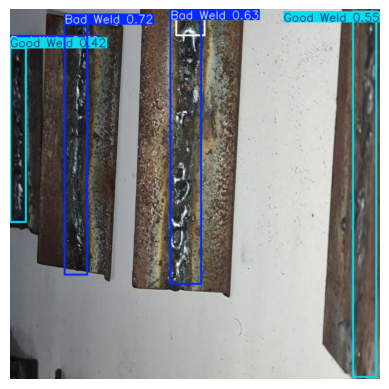

Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid570_jpeg_jpg.rf.15e7a658b6f4bf340960ea1a205a1cdc.jpg: 640x640 2 Good Welds, 303.0ms
Speed: 3.2ms preprocess, 303.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


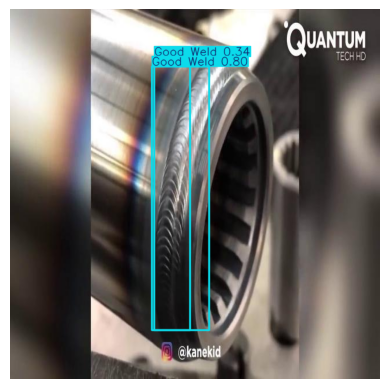

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_1_mp4-59_jpg.rf.b500f4a89177615c16be765f9f15b910.jpg: 640x640 1 Bad Weld, 3 Good Welds, 1 Defect, 304.9ms
Speed: 3.0ms preprocess, 304.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


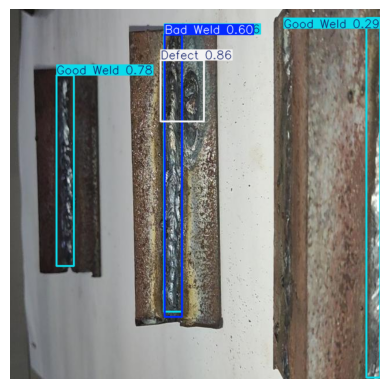

Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_1_mp4-60_jpg.rf.40f4a4094130e65b1a801b49fefc5d01.jpg: 640x640 2 Bad Welds, 3 Good Welds, 3 Defects, 315.6ms
Speed: 6.4ms preprocess, 315.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


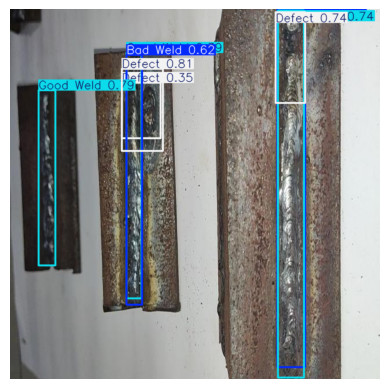

Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/porosity-worm-hole-weld-defect-welding-process-flux-cored-arc-fcaw-204492534_jpeg_jpg.rf.c5201d1c888e3ffa1fded39930503d32.jpg: 640x640 1 Bad Weld, 3 Defects, 323.8ms
Speed: 3.4ms preprocess, 323.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


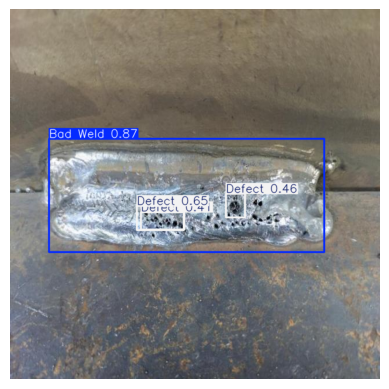

Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid1524_jpeg_jpg.rf.923ca28d540ddd883e105a445dfff8a3.jpg: 640x640 2 Good Welds, 336.5ms
Speed: 2.7ms preprocess, 336.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


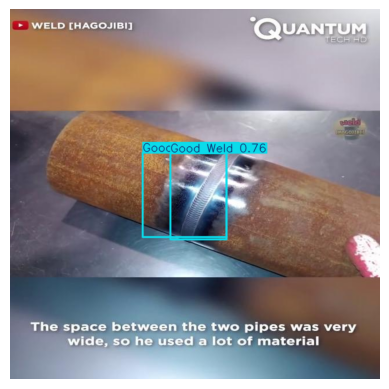

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV1_1_mp4-1_jpg.rf.3f50c974a91c4e6348dd49491f06def8.jpg: 640x640 6 Bad Welds, 8 Good Welds, 7 Defects, 308.4ms
Speed: 3.0ms preprocess, 308.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


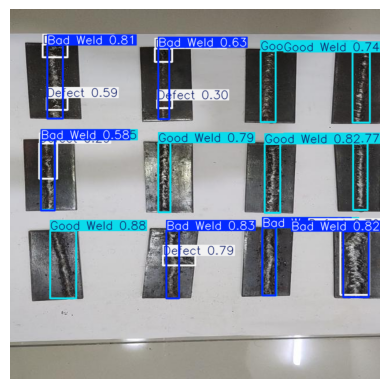

Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid1778_jpeg_jpg.rf.d35cb0ff2061fb1318822c88996de9e0.jpg: 640x640 3 Good Welds, 342.7ms
Speed: 2.9ms preprocess, 342.7ms inference, 1.2ms postprocess per image at shap

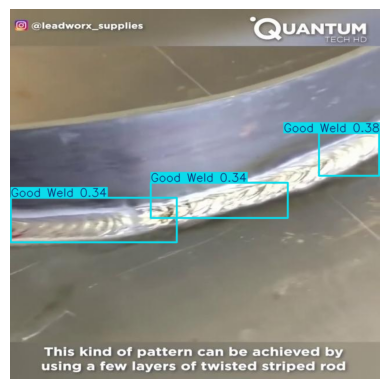

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Spatters-welding-images_9_jpeg_jpg.rf.a43f10bbaf404937f530d9c278654acb.jpg: 640x640 1 Good Weld, 425.4ms
Speed: 3.9ms preprocess, 425.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


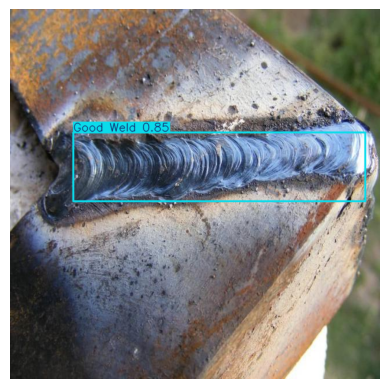

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_1_mp4-90_jpg.rf.19ad4979865d6aba1cfaaa23f1dfb1f9.jpg: 640x640 3 Bad Welds, 1 Good Weld, 3 Defects, 304.6ms
Speed: 5.9ms preprocess, 304.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


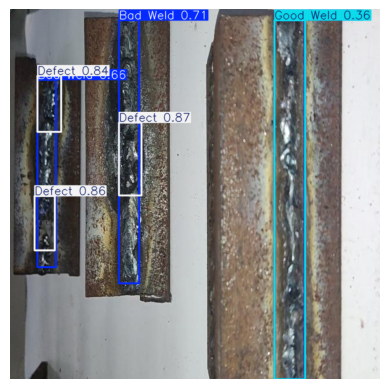

Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid2265_jpeg_jpg.rf.8a70ab5ca12dc7c63f19d1dadeaddaa5.jpg: 640x640 1 Good Weld, 344.7ms
Speed: 9.9ms preprocess, 344.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


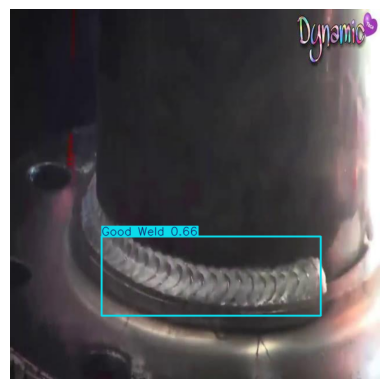

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Good-Welding-images_23_jpeg_jpg.rf.fdf50352e3c124ff6edab3e96257a040.jpg: 640x640 1 Bad Weld, 354.1ms
Speed: 5.9ms preprocess, 354.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


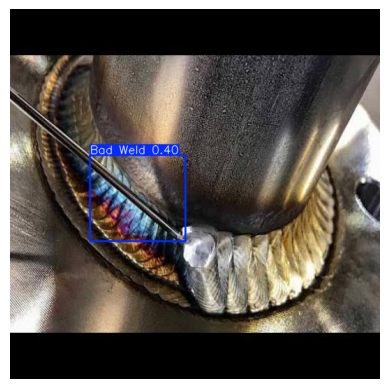

Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/imagerty4ys_jpeg_jpg.rf.63bb94db9a6bb65e4f87abe7f1eae488.jpg: 640x640 1 Bad Weld, 402.3ms
Speed: 3.0ms preprocess, 402.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


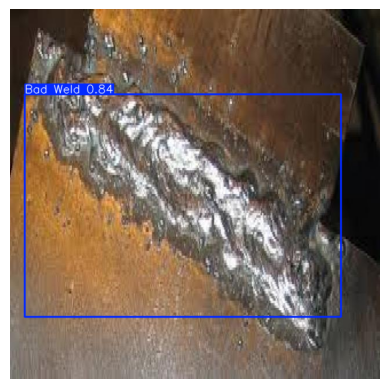

Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_1_mp4-0_jpg.rf.32dc225d9b5d11d01260f75c918a9961.jpg: 640x640 1 Bad Weld, 12 Good Welds, 2 Defects, 315.0ms
Speed: 3.0ms preprocess, 315.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


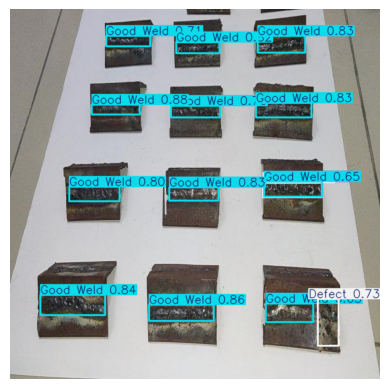

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Good-Welding-images_33_jpeg_jpg.rf.782ccc0dfca926b946a6b664dd4cacd1.jpg: 640x640 1 Good Weld, 364.6ms
Speed: 6.1ms preprocess, 364.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


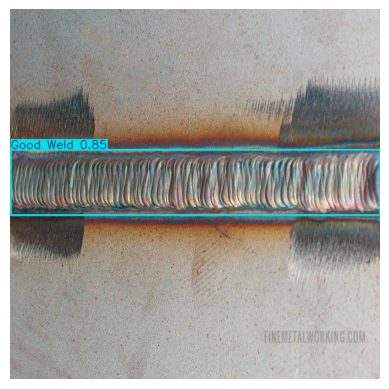

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid414_jpeg_jpg.rf.39639646ba20dd336dd4f880cafd2f7a.jpg: 640x640 (no detections), 319.1ms
Speed: 6.3ms preprocess, 319.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


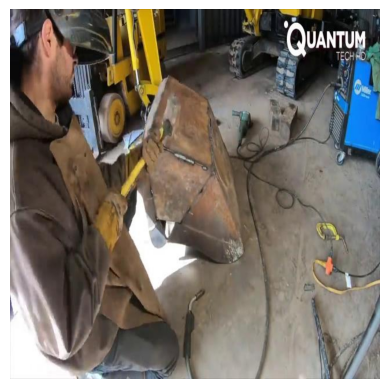


image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid1098_jpeg_jpg.rf.9237cce5d77a8a1c3a6dda6c976ca7d5.jpg: 640x640 (no detections), 340.8ms
Speed: 2.9ms preprocess, 340.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


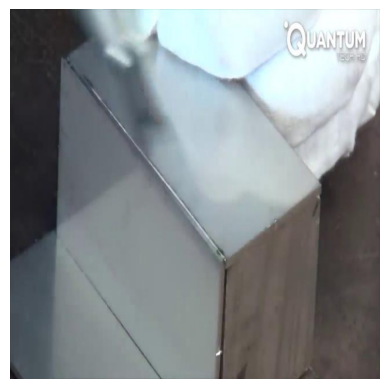


image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_2_mp4-59_jpg.rf.5e6543b79b7abac05cf8005d24f61eb5.jpg: 640x640 1 Bad Weld, 1 Good Weld, 3 Defects, 373.4ms
Speed: 3.2ms preprocess, 373.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


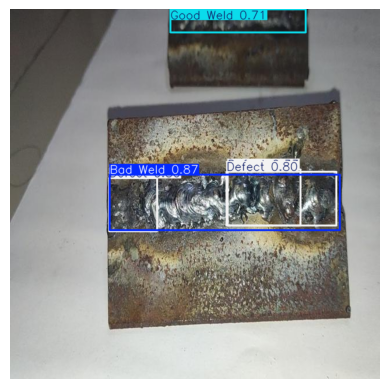

Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV3_1_mp4-8_jpg.rf.15adb36ac87bf5e5533ced60df5f5635.jpg: 640x640 2 Good Welds, 330.3ms
Speed: 8.7ms preprocess, 330.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


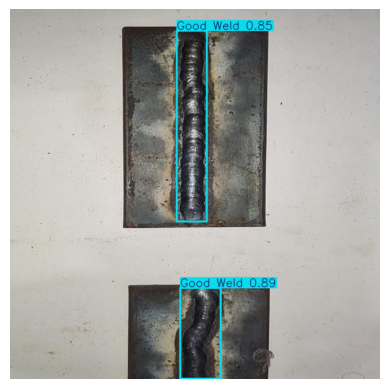

Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV3_2_mp4-2_jpg.rf.f673f3917f7d15f03110e853f63696dc.jpg: 640x640 3 Bad Welds, 2 Good Welds, 3 Defects, 333.7ms
Speed: 5.5ms preprocess, 333.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


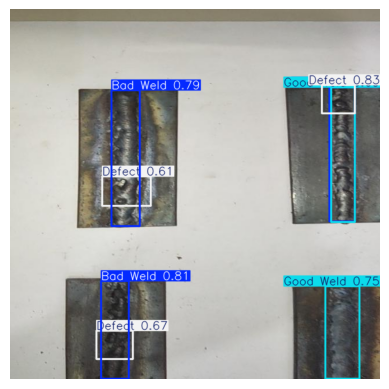

Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Bad Weld, Color: (0, 0, 255)
Class: Good Weld, Color: (0, 255, 0)
Class: Good Weld, Color: (0, 255, 0)
Class: Defect, Color: (255, 0, 0)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/SampleV2_2_mp4-76_jpg.rf.492360f34b458a190c41d157fff3dbba.jpg: 640x640 1 Good Weld, 386.7ms
Speed: 2.9ms preprocess, 386.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


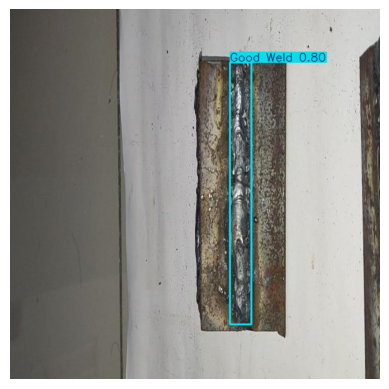

Class: Good Weld, Color: (0, 255, 0)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/good_weld_vid529_jpeg_jpg.rf.4dc697dcd18f7c7de001311bb1f845e6.jpg: 640x640 (no detections), 305.9ms
Speed: 2.9ms preprocess, 305.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


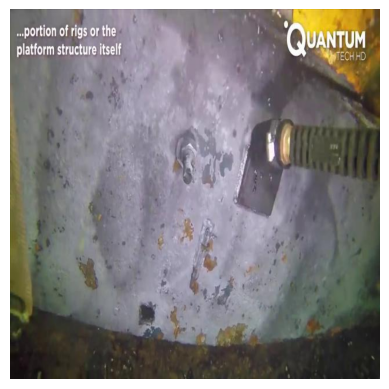


image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Screenshot-2022-12-05-224335_jpeg_jpg.rf.bcfe0035e76676a1f9056aea47c18999.jpg: 640x640 2 Bad Welds, 2 Defects, 307.2ms
Speed: 3.1ms preprocess, 307.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


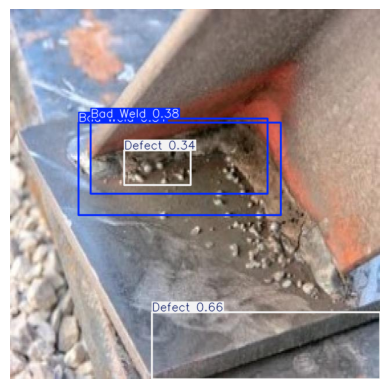

Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Class: Bad Weld, Color: (0, 0, 255)

image 1/1 /content/drive/MyDrive/The Welding Defect Dataset/test/images/Slag-inclusion-welding-images_5_jpeg_jpg.rf.0e134d6e310d401ae657279a12daa898.jpg: 640x640 1 Bad Weld, 1 Defect, 360.1ms
Speed: 4.4ms preprocess, 360.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


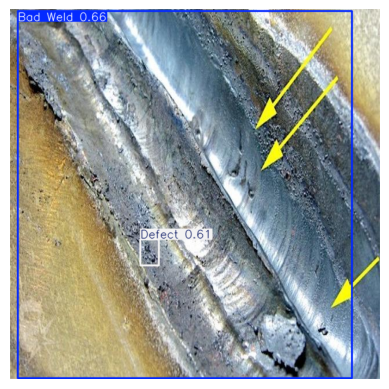

Class: Bad Weld, Color: (0, 0, 255)
Class: Defect, Color: (255, 0, 0)
Results saved in /content/drive/MyDrive/test_results/test_results.xlsx


In [ ]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd

# Create folder for saving annotated images
output_folder = '/content/drive/MyDrive/test_results/images_edit'
os.makedirs(output_folder, exist_ok=True)

test_image_folder = '/content/drive/MyDrive/The Welding Defect Dataset/test/images'

result_list = []

# Define colors for each class (BGR format)
colors = {
    "Good Weld": (0, 255, 0),  # Green
    "Bad Weld": (0, 0, 255),   # Blue
    "Defect": (255, 0, 0)      # Red
}

for image_filename in os.listdir(test_image_folder):
  if image_filename.endswith(('.jpg','.jpeg','.png')):
    image_path = os.path.join(test_image_folder, image_filename)

    results = model_ft.predict(source=image_path)

    ################## tambah visualization code to show the test/images here ################
    result = results[0]

    # Visualise the test data
    from PIL import Image
    import matplotlib.pyplot as plt
    #Reverses the color channels from BGR (Blue, Green, Red) to RGB (Red, Green, Blue)
    image = Image.fromarray(result.plot()[:,:,::-1])
    plt.imshow(image)
    plt.axis('off')  # Turn off the axis labels and ticks
    plt.show()

    ################## tambah visualization code to show the test/images here ################


    # Load the image
    image = cv2.imread(image_path)
    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw bounding boxes on the image
    for result in results:
        for box in result.boxes:
            coords = box.xyxy[0].tolist()
            class_id = int(box.cls[0].item())
            confidence = box.conf[0].item()
            label = f"{model_ft.names[class_id]}: {confidence:.2f}"

            # Get the class name for the color
            class_name = model_ft.names[class_id]
            color = colors.get(class_name, (255, 255, 255))  # Default to white if not found

            print(f"Class: {class_name}, Color: {color}")

            # Draw rectangle
            cv2.rectangle(image, (int(coords[0]), int(coords[1])), (int(coords[2]), int(coords[3])), color, 2)
            # Put label in white
            cv2.putText(image, label, (int(coords[0]), int(coords[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

            result_list.append([image_filename, class_name, confidence])

    output_image_path = os.path.join(output_folder, image_filename)
    annotated_image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    cv2.imwrite(output_image_path, annotated_image)

df = pd.DataFrame(result_list, columns=['Image', 'Class', 'Confidence'])
excel_pth = '/content/drive/MyDrive/test_results/test_results.xlsx'
df.to_excel(excel_pth, index=False)
print(f"Results saved in {excel_pth}")